1. Grab Images
2. Resize Images
3. Parse/Segment Images
- Keep one image for each of the 18 layers except background
- Resize segmented images
- Metadata for entry includes: layer and celebrity name
4. Vectorize Images
5. Save into Milvus along with name of celebrity

In [1]:
from torchvision.transforms import Resize

/Users/yujiantang/Documents/workspace/fashionai/fai/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/Users/yujiantang/Documents/workspace/fashionai/fai/lib/python3.10/site-packages/transformers/models/segformer/feature_extraction_segformer.py:28: FutureWarning: The class SegformerFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use SegformerImageProcessor instead.
  warnings.warn(
/Users/yujiantang/Documents/workspace/fashionai/fai/lib/python3.10/site-packages/transformers/models/segformer/image_processing_segformer.py:99: FutureWarning: The `reduce_labels` parameter is deprecated and will be removed in a future version. Please use `do_reduce_labels` instead.
  warnings.warn(


{'pixel_values': tensor([[[[ 0.6049,  0.6049,  0.5536,  ..., -0.0972, -0.1143, -0.0287],
          [ 0.5878,  0.5878,  0.5536,  ..., -0.0287, -0.0287,  0.0741],
          [ 0.5193,  0.5364,  0.4851,  ...,  0.0398,  0.1083,  0.2282],
          ...,
          [-0.4397, -0.4739, -0.4226,  ..., -2.1008, -2.1179, -2.1008],
          [-0.4226, -0.4054, -0.3369,  ..., -2.0837, -2.0837, -2.0837],
          [-0.2856, -0.2856, -0.2513,  ..., -1.9809, -1.9809, -1.9809]],

         [[ 0.4153,  0.4503,  0.4328,  ..., -0.1099, -0.0224,  0.0826],
          [ 0.4153,  0.4503,  0.4328,  ..., -0.0399,  0.0476,  0.1702],
          [ 0.3627,  0.3803,  0.3803,  ...,  0.0301,  0.1702,  0.2927],
          ...,
          [-0.3200, -0.3550, -0.3025,  ..., -2.0182, -2.0357, -2.0182],
          [-0.3025, -0.2850, -0.2150,  ..., -2.0007, -2.0007, -2.0007],
          [-0.1625, -0.1625, -0.1275,  ..., -1.8957, -1.8957, -1.8957]],

         [[ 0.0605,  0.0779,  0.0605,  ..., -0.1138, -0.0964, -0.0092],
          [ 0

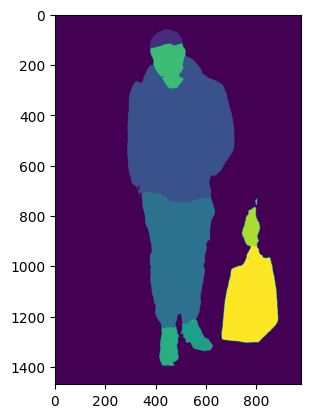

In [2]:
from transformers import AutoFeatureExtractor, SegformerForSemanticSegmentation
from PIL import Image
import matplotlib.pyplot as plt
import torch.nn as nn

extractor = AutoFeatureExtractor.from_pretrained("mattmdjaga/segformer_b2_clothes")
model = SegformerForSemanticSegmentation.from_pretrained("mattmdjaga/segformer_b2_clothes")

image = Image.open("./photos/Drake/Drake_6.jpg")
# image = Resize(size=(256, 256))(image)

inputs = extractor(images=image, return_tensors="pt")
# print(inputs)

outputs = model(**inputs)
# print(outputs)
logits = outputs.logits.cpu()

upsampled_logits = nn.functional.interpolate(
    logits,
    size=image.size[::-1],
    mode="bilinear",
    align_corners=False,
)

pred_seg = upsampled_logits.argmax(dim=1)[0]
plt.imshow(pred_seg)

In [6]:
print(outputs["logits"].size())

torch.Size([1, 18, 128, 128])


In [20]:
print(type(inputs['pixel_values']))
print(inputs['pixel_values'].shape)

<class 'torch.Tensor'>
torch.Size([1, 3, 512, 512])


In [21]:
import torch

In [22]:
inputs['pixel_values'].flatten().shape

torch.Size([786432])

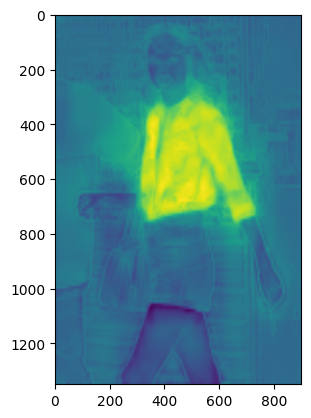

In [23]:
plt.imshow(upsampled_logits[0][4].detach().numpy())

In [24]:
list(pred_seg.shape)

[1350, 900]

In [25]:
import numpy as np

In [26]:
from torch import tensor, zeros

In [27]:
pred_seg2 = zeros(pred_seg.shape[0], pred_seg.shape[1])
count = 0
# vals = set()
for i in range(list(pred_seg.shape)[0]):
    for j in range(list(pred_seg.shape)[1]):
        if pred_seg[i][j] != tensor(0):
            count += 1
            pred_seg2[i][j] = pred_seg[i][j]
print(count)

431524


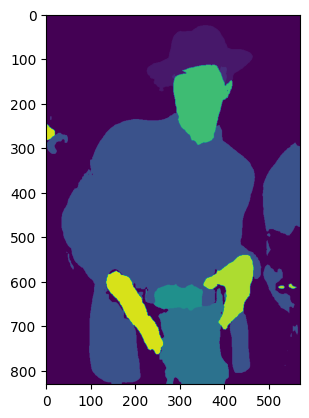

In [32]:
plt.imshow(pred_seg2)

In [33]:
pred_seg.shape

torch.Size([831, 570])

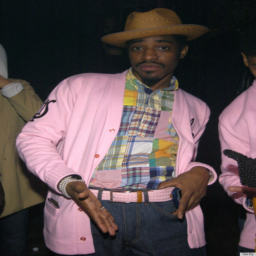

In [34]:
from torchvision.transforms import Resize
Resize(size=(256, 256))(image)

In [35]:
type(image)

PIL.JpegImagePlugin.JpegImageFile

In [36]:
import torchvision.transforms as T

In [37]:
x = T.ToPILImage()(pred_seg2)

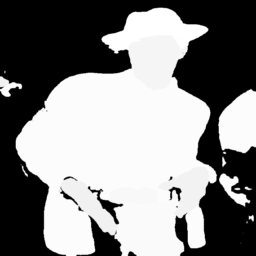

In [38]:
Resize(size=(256, 256))(x)

In [39]:
x1 = T.ToPILImage()(upsampled_logits[0][4])

In [40]:
import torch

In [41]:
val = set()
for i in upsampled_logits[0][4]:
    for j in i:
        torch.round(j)
        print(j.item())

-3.109548330307007
-3.109548330307007
-3.1496074199676514
-3.296109914779663
-3.4426121711730957
-3.5891146659851074
-3.735617160797119
-3.729182004928589
-3.689246416091919
-3.649311065673828
-3.609375476837158
-3.580165147781372
-3.569438934326172
-3.5587124824523926
-3.5479860305786133
-3.537259578704834
-3.545806884765625
-3.556166172027588
-3.566525459289551
-3.576885223388672
-3.599315643310547
-3.6358635425567627
-3.6724114418029785
-3.7089591026306152
-3.745152235031128
-3.7363064289093018
-3.7274603843688965
-3.7186145782470703
-3.709768772125244
-3.705983877182007
-3.7062618732452393
-3.706540107727051
-3.706818103790283
-3.703383684158325
-3.667109489440918
-3.6308350563049316
-3.5945611000061035
-3.558286666870117
-3.532590627670288
-3.512629508972168
-3.4926681518554688
-3.4727072715759277
-3.46065092086792
-3.4811623096466064
-3.501673698425293
-3.5221853256225586
-3.542696714401245
-3.5410916805267334
-3.531804084777832
-3.5225167274475098
-3.5132288932800293
-3.50969862

In [42]:
val

set()

In [288]:
upsampled_logits[0][4]

tensor([[-3.2154, -3.4145, -3.8127,  ..., -4.0525, -4.1924, -4.2624],
        [-3.3124, -3.4875, -3.8377,  ..., -4.0841, -4.2823, -4.3815],
        [-3.5065, -3.6336, -3.8877,  ..., -4.1473, -4.4622, -4.6196],
        ...,
        [-3.5246, -3.7420, -4.1768,  ..., -3.9570, -4.0924, -4.1601],
        [-3.4367, -3.6770, -4.1576,  ..., -3.9707, -4.0697, -4.1192],
        [-3.3927, -3.6445, -4.1480,  ..., -3.9775, -4.0584, -4.0988]],
       grad_fn=<SelectBackward0>)

In [28]:
pred_seg_dict = {}
# zeros(pred_seg.shape[0], pred_seg.shape[1])
for i in range(list(pred_seg.shape)[0]):
    for j in range(list(pred_seg.shape)[1]):
        if pred_seg[i][j] != tensor(0):
            val = pred_seg[i][j].item()
            if val in pred_seg_dict:
                pred_seg_dict[val][i][j] = pred_seg[i][j]
            else:
                pred_seg_dict[val] = zeros(pred_seg.shape[0], pred_seg.shape[1])
                pred_seg_dict[val][i][j] = pred_seg[i][j]

dict_keys([2, 1, 11, 4, 16, 14, 15, 5, 13, 12])

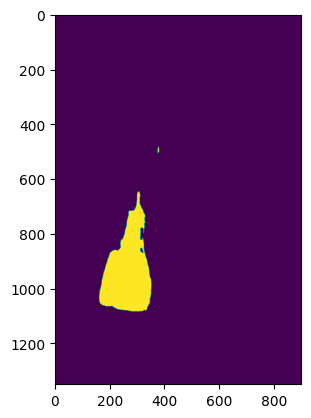

In [29]:
plt.imshow(pred_seg_dict.get(16))
pred_seg_dict.keys()

In [36]:
obj_ids = torch.unique(pred_seg)

In [37]:
obj_ids[1:]

tensor([ 2,  4,  6,  9, 10, 11, 12, 14, 16])

In [38]:
masks = pred_seg == obj_ids[:, None, None]
print(type(masks))

<class 'torch.Tensor'>


In [39]:
import numpy as np

2


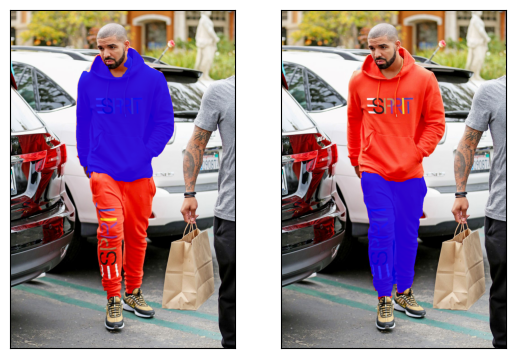

In [41]:
from torchvision.utils import draw_segmentation_masks
from torchvision.io import read_image
import torchvision.transforms.functional as F
import torchvision.transforms as T

img = read_image("./photos/Drake/Drake_6.jpg")

drawn_masks = []
for mask in masks:
    # print(image.shape)
    # print(mask.shape)
    drawn_masks.append(draw_segmentation_masks(img, mask, alpha=0.8, colors="blue"))

def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fix, axs = plt.subplots(ncols=len(imgs), squeeze=False)
    print(len(imgs))
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

show(drawn_masks[2:4])

In [42]:
from torchvision.ops import masks_to_boxes

boxes = masks_to_boxes(masks)
print(boxes.size())
print(boxes)

torch.Size([10, 4])
tensor([[   0.,    0.,  979., 1469.],
        [ 377.,   61.,  505.,  136.],
        [ 287.,  169.,  711.,  749.],
        [ 346.,  705.,  633., 1248.],
        [ 499., 1211.,  624., 1338.],
        [ 414., 1243.,  491., 1397.],
        [ 378.,  116.,  517.,  295.],
        [ 534.,  733.,  801., 1223.],
        [ 742.,  737.,  812.,  923.],
        [ 661.,  921.,  884., 1305.]])


1


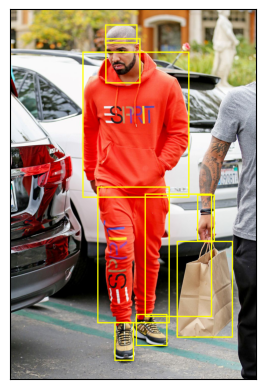

In [46]:
from torchvision.utils import draw_bounding_boxes

drawn_boxes = draw_bounding_boxes(img, boxes[1:], colors="yellow", width=5)
show(drawn_boxes)

In [348]:
def selective_mask_t(image_src, mask, channels=[]):
    mask = mask[:, torch.tensor(channels).long()]
    mask = torch.sgn(torch.sum(mask, dim=1)).to(dtype=image_src.dtype).unsqueeze(-1)
    return mask * image_src

In [349]:
print(len(drawn_boxes))

3


In [317]:
id2label= {
    0: "Background",
    1: "Hat",
    2: "Hair",
    3: "Sunglasses",
    4: "Upper-clothes",
    5: "Skirt",
    6: "Pants",
    7: "Dress",
    8: "Belt",
    9: "Left-shoe",
    10: "Right-shoe",
    11: "Face",
    12: "Left-leg",
    13: "Right-leg",
    14: "Left-arm",
    15: "Right-arm",
    16: "Bag",
    17: "Scarf"
  }
# want to extract keys: 1, 3, 4, 5, 6, 7, 8, 9, 10, 16, 17

In [350]:
# boxes are x1, y1, x2, y2 --> turn them into top, left, h, w for cropping
crop_boxes = []
for box in boxes:
    crop_box = tensor([box[0], box[1], box[2]-box[0], box[3]-box[1]])
    crop_boxes.append(crop_box)

In [351]:
from torchvision.transforms.functional import crop

In [363]:
crop_boxes

[tensor([  0.,   0., 255., 255.]),
 tensor([95., 14., 35., 33.]),
 tensor([116.,  82.,   2.,   3.]),
 tensor([98., 39., 29., 15.]),
 tensor([ 43.,  69., 181., 163.]),
 tensor([ 86., 199.,  62.,  56.]),
 tensor([102., 196.,  29.,   7.]),
 tensor([99., 38., 28., 41.]),
 tensor([219., 101.,  19.,  24.]),
 tensor([ 18., 137.,  28.,  31.]),
 tensor([ 19., 122.,  23.,  25.])]

In [364]:
boxes

tensor([[  0.,   0., 255., 255.],
        [ 95.,  14., 130.,  47.],
        [116.,  82., 118.,  85.],
        [ 98.,  39., 127.,  54.],
        [ 43.,  69., 224., 232.],
        [ 86., 199., 148., 255.],
        [102., 196., 131., 203.],
        [ 99.,  38., 127.,  79.],
        [219., 101., 238., 125.],
        [ 18., 137.,  46., 168.],
        [ 19., 122.,  42., 147.]])

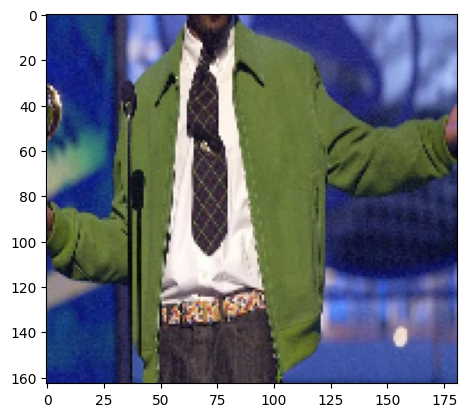

In [366]:
# for crop_box in crop_boxes:
#     cropped = crop(image, crop_box[0].item(), crop_box[1].item(), crop_box[2].item(), crop_box[3].item())
#     plt.show(cropped)
#     break
crop_box = crop_boxes[4]
cropped = crop(img_t, crop_box[1].item(), crop_box[0].item(), crop_box[3].item(), crop_box[2].item())
plt.imshow(cropped)

In [341]:
img_t = T.transforms.ToPILImage()(img)

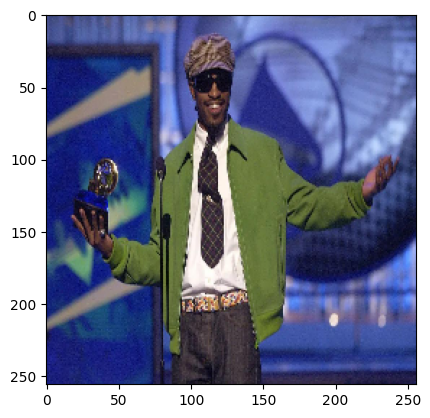

In [353]:
plt.imshow(img_t)

In [371]:
type(image)
img_t_copy = img_t

In [375]:
img_copy = img

In [402]:
pred_seg.shape

torch.Size([256, 256])

In [420]:
for i, row in enumerate(pred_seg):
    print(row)
    print(i)
    for j, entry in enumerate(row):
        print(entry)
        print(j)
        if entry == tensor(0):
            print(entry)
            img_copy[0][i][j] = tensor(0)
            img_copy[1][i][j] = tensor(0)
            img_copy[2][i][j] = tensor(0)

tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
0
tensor(0)
0
tensor(0)
tensor(0)
1
tensor(0)
tensor(0)
2
tensor(0)
tensor(0)
3
tensor(0)
tensor(0)
4
tensor(0)
tensor(0)
5
tensor(0)
tensor(0)

tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 6, 6, 6, 6, 6, 6, 6, 6,
        6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
        6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
        6, 6, 6, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])


In [421]:
print(type(img_copy))
print(img_copy)


<class 'torch.Tensor'>
tensor([[[0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0]],

        [[0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0]],

        [[0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0]]], dtype=torch.uint8)


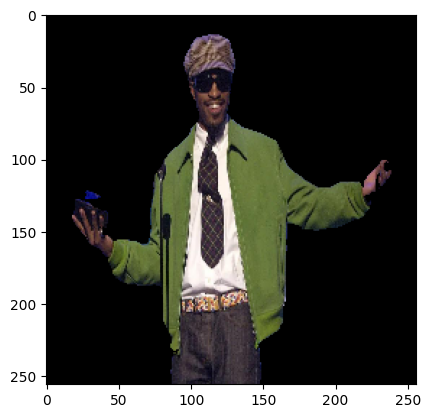

In [424]:
plt.imshow(T.transforms.ToPILImage()(img_copy))

In [422]:
img_copy[0].shape

torch.Size([256, 256])

In [379]:
pred_seg.size()

torch.Size([256, 256])

In [432]:
img_new = T.transforms.ToPILImage()(img_copy)

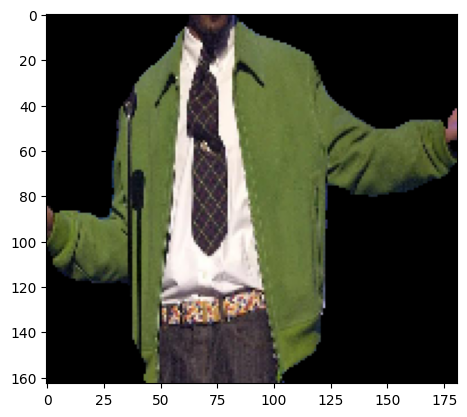

In [433]:
crop_box = crop_boxes[4]
cropped = crop(img_new, crop_box[1].item(), crop_box[0].item(), crop_box[3].item(), crop_box[2].item())
plt.imshow(cropped)

In [436]:
cropped.size

(181, 163)

In [440]:
print(len(crop_boxes))
cropped_images = []
for i in range(len(crop_boxes)):
    crop_box = crop_boxes[i]
    cropped = crop(img_new, crop_box[1].item(), crop_box[0].item(), crop_box[3].item(), crop_box[2].item())
    cropped_images.append(cropped)

11


In [7]:
def delete_background(segmentation, base_image):
    for i, row in enumerate(segmentation):
        for j, entry in enumerate(row):
            if entry == tensor(0):
                base_image[0][i][j] = tensor(0)
                base_image[1][i][j] = tensor(0)
                base_image[2][i][j] = tensor(0)
    return base_image

In [8]:
# returns a dictionary of segmentations given an image segmented by
# "mattmdjaga/segformer_b2_clothes" from hugging face
def get_masks(segmentation):
    obj_ids = torch.unique(segmentation)
    obj_ids = obj_ids[1:]
    masks = segmentation == obj_ids[:, None, None]
    return masks, obj_ids

In [449]:
def get_drawn_masks(masks, obj_ids, img):
    drawn_masks = {}
    for i, mask in enumerate(masks):
        drawn_masks[obj_ids[i]] = draw_segmentation_masks(img, mask, alpha=0.8, colors="blue")
    return drawn_masks

def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fix, axs = plt.subplots(ncols=len(imgs), squeeze=False)
    print(len(imgs))
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

In [9]:
def get_segmentation(extractor, model, image):
    inputs = extractor(images=image, return_tensors="pt")

    outputs = model(**inputs)
    logits = outputs.logits.cpu()

    upsampled_logits = nn.functional.interpolate(
        logits,
        size=image.size[::-1],
        mode="bilinear",
        align_corners=False,
    )

    pred_seg = upsampled_logits.argmax(dim=1)[0]
    return pred_seg 

In [445]:
def get_seg_dict(segmentation):
    segmentation_dict = {}
    for i in range(list(segmentation.shape)[0]):
        for j in range(list(segmentation.shape)[1]):
            if segmentation[i][j] != tensor(0):
                val = segmentation[i][j].item()
                if val in segmentation_dict:
                    segmentation_dict[val][i][j] = segmentation[i][j]
                else:
                    segmentation_dict[val] = zeros(segmentation.shape[0], segmentation.shape[1])
                    segmentation_dict[val][i][j] = segmentation[i][j]
    return segmentation_dict

In [10]:
def crop_images(masks, obj_ids, img):
    boxes = masks_to_boxes(masks)
    crop_boxes = []
    for box in boxes:
        crop_box = tensor([box[0], box[1], box[2]-box[0], box[3]-box[1]])
        crop_boxes.append(crop_box)
    cropped_images = {}
    for i in range(len(crop_boxes)):
        crop_box = crop_boxes[i]
        cropped = crop(img, crop_box[1].item(), crop_box[0].item(), crop_box[3].item(), crop_box[2].item())
        cropped_images[obj_ids[i].item()] = cropped
    return cropped_images

In [11]:
# get segmentation
# delete background
# get masks
# crop images
# get vectorized images for each mask id
# save images in vector db along with mask id
extractor = AutoFeatureExtractor.from_pretrained("mattmdjaga/segformer_b2_clothes")
model = SegformerForSemanticSegmentation.from_pretrained("mattmdjaga/segformer_b2_clothes")
image = Image.open("./photos/Andre_3000/Andre_3000_5.jpg")

pred_seg = get_segmentation(extractor, model, image)
masks, ids = get_masks(pred_seg)
cropped_images = crop_images(masks, ids, image)

NameError: name 'torch' is not defined

In [6]:
preprocess = T.Compose([
    T.Resize(size=(256, 256)),
    T.ToTensor()
])

NameError: name 'T' is not defined

In [2]:
def get_embeddings(extractor, image):
    return extractor(images=image, return_tensors="pt")["pixel_values"]

In [3]:
x4 = get_embeddings(extractor, preprocess(cropped_images[4]))

NameError: name 'extractor' is not defined